## Initialization

In [2]:
%%capture
# give permissions to kaggle API
! pip install kaggle
! mkdir /root/.kaggle
! cp kaggle.json /root/.kaggle
! chmod 600 /root/.kaggle/kaggle.json

In [ ]:
%%capture
# download dataset from kaggle to colab
! kaggle datasets download -d rayonegautam/charanet

# extract the content of the zipped file
!unzip /content/charanet.zip -d /content/

In [4]:
# remove uncessary files
! rm -r /content/charanet.zip
! rm -r /content/kaggle.json
! rm -r /content/sample_data

## Modules & Libraries

In [92]:
import os
import librosa
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import soundfile as sf
import seaborn as sns

In [49]:
dataset_path = '/content/charaNet'
training_folder = '/content/charaNet/train'
validation_folder = '/content/charaNet/val'
testing_folder = '/content/charaNet/test'

## **Distribution of audio files in each class**

In [63]:
def count_files_in_folder(folder_path):
    """
    Counts the number of audio files in each subfolder of the given folder.
    """
    data = []
    for class_name in os.listdir(folder_path):
        class_path = os.path.join(folder_path, class_name)
        if os.path.isdir(class_path):
            count = len([f for f in os.listdir(class_path)])  # Filter audio files
            data.append({'Label': class_name, 'Count': count})

    return pd.DataFrame(data)

In [103]:
def plot_distribution(df, title):
    """Plot the distribution of audio files in each class."""

    plt.figure(figsize=(10, 8))

    sns.barplot(data=df, x='Label', y='Count', hue='Label', legend=False)

    # Add title and labels
    plt.title(title, fontsize=12)
    plt.xlabel('Class', fontsize=10)
    plt.ylabel('Number of Audio Files', fontsize=10)

    # Adjust font size and rotation for better readability
    plt.xticks(fontsize=8, rotation=90)
    plt.yticks(fontsize=8)

    plt.tight_layout()
    plt.show()
    print('\n')

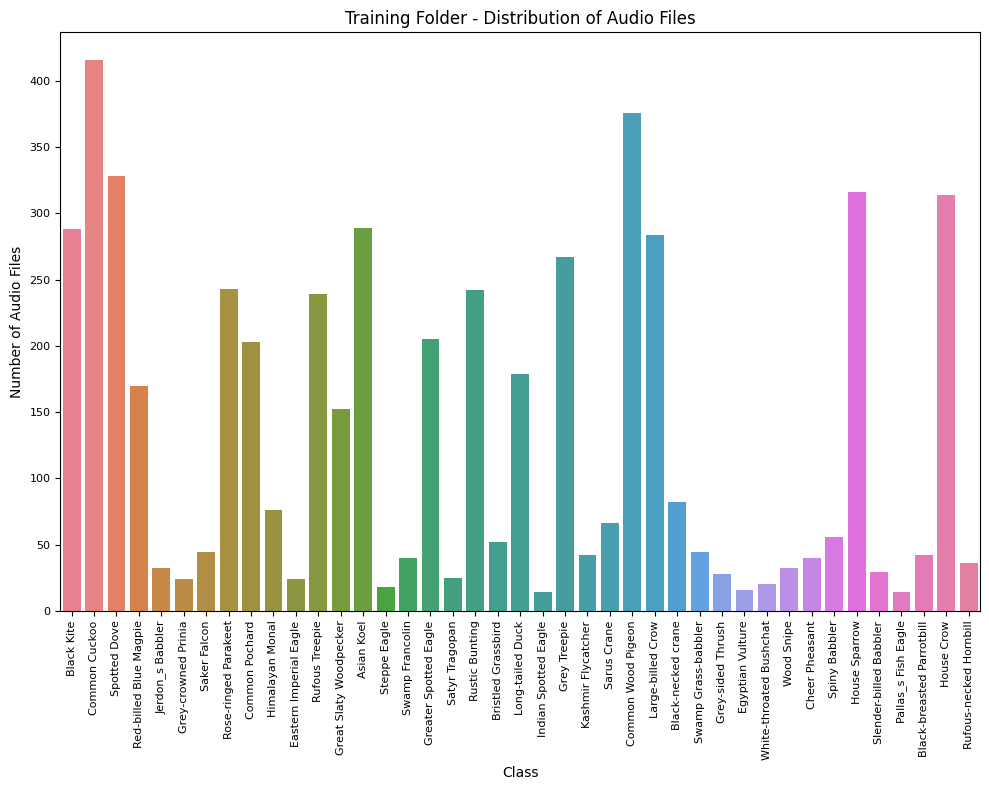

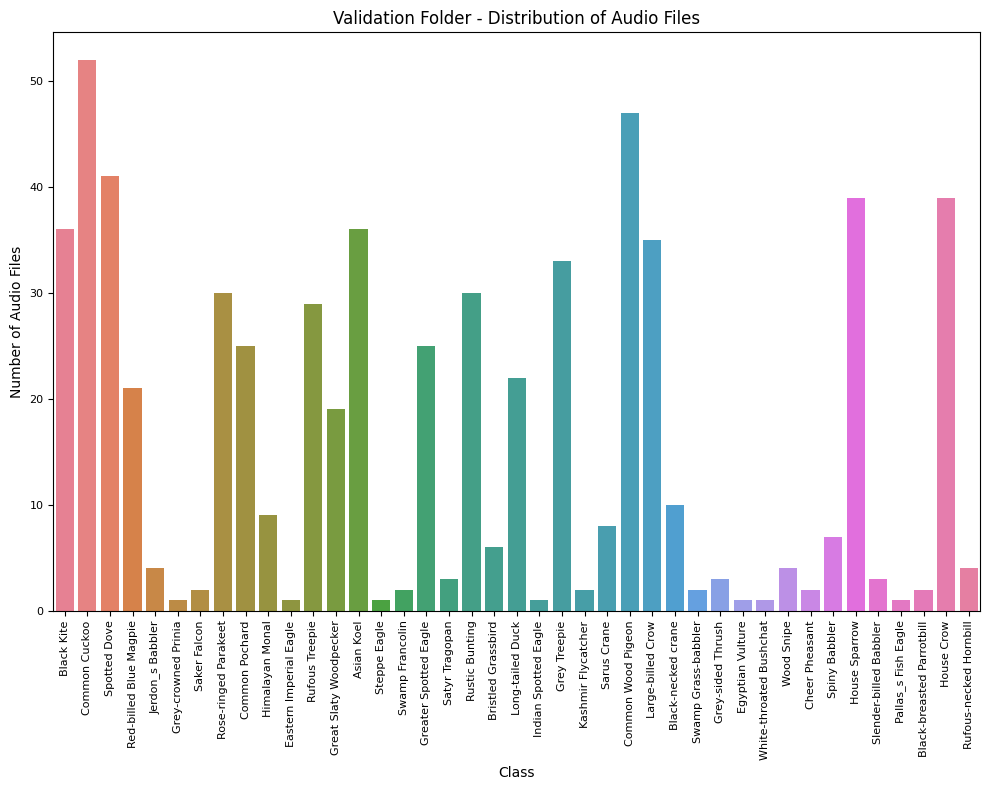

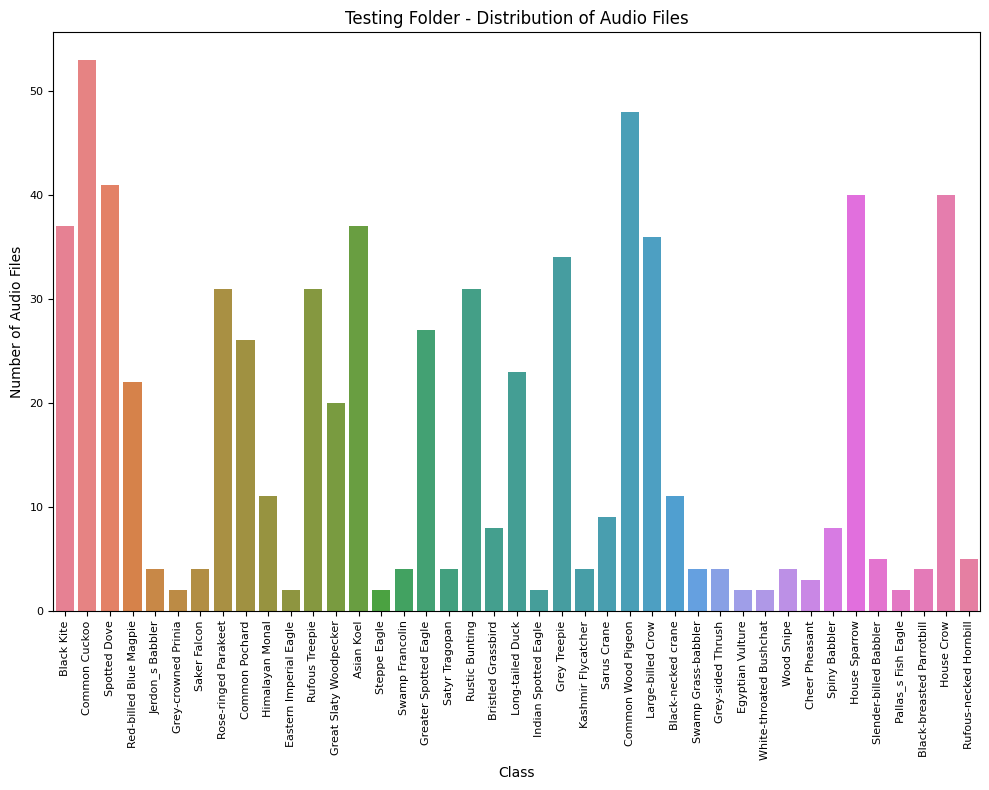

In [104]:
# Count files and create DataFrames
df_train = count_files_in_folder(training_folder)
df_val = count_files_in_folder(validation_folder)
df_test = count_files_in_folder(testing_folder)

# Plot distributions
plot_distribution(df_train, 'Training Folder - Distribution of Audio Files')

plot_distribution(df_val, 'Validation Folder - Distribution of Audio Files')

plot_distribution(df_test, 'Testing Folder - Distribution of Audio Files')


## **Visualizating features of sample audio from each class**

In [20]:
def plot_waveform(signal, sr, ax):
    """Plot the waveform of the audio signal."""

    librosa.display.waveshow(signal, sr=sr, ax=ax)
    ax.set_title('Time Domain Waveform')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Amplitude')

In [32]:
def plot_periodogram(signal, sr, ax):
    """Plot the periodogram of the audio signal."""
    fft = np.fft.fft(signal)
    magnitude = np.abs(fft)
    frequency = np.linspace(0, sr, len(magnitude))

    ax.plot(frequency, magnitude)
    ax.set_title('Frequency Domain Waveform')
    ax.set_xlabel('Frequency (Hz)')
    ax.set_ylabel('Magnitude (dB)')

In [27]:
def plot_spectrogram(signal, sr, ax):
    """Plot the spectrogram of the audio signal."""

    n_fft = 2046
    hop_length = 512

    stft = librosa.core.stft(signal, hop_length=hop_length, n_fft=n_fft)
    spectrogram = np.abs(stft)
    log_spectrogram = librosa.amplitude_to_db(spectrogram)

    librosa.display.specshow(log_spectrogram, sr=sr, hop_length=hop_length, ax=ax)
    ax.set_title('Spectrogram')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Frequency (Hz)')

In [28]:
def plot_mfcc(signal, sr, ax):
    """Plot the MFCCs of the audio signal."""

    n_fft = 2046
    hop_length = 512

    mfcc = librosa.feature.mfcc(y=signal, sr=sr, n_mfcc=13, n_fft=n_fft, hop_length=hop_length)
    librosa.display.specshow(mfcc, sr=sr, hop_length=hop_length, ax=ax)
    ax.set_title('Mel-Frequency Cepstral Coefficients')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('MFCC')

In [89]:
def plot_audio_visualizations(signal, sr, class_name):
    """Plot all audio visualizations in a single figure with subplots and add class title."""

    fig, axs = plt.subplots(2, 2, figsize=(10, 6))
    fig.suptitle(f'Species: {class_name}', fontsize=16)

    # Plot waveform
    plot_waveform(signal, sr, axs[0, 0])

    # Plot periodogram
    plot_periodogram(signal, sr, axs[0, 1])

    # Plot spectrogram
    plot_spectrogram(signal, sr, axs[1, 0])

    # Plot MFCC
    plot_mfcc(signal, sr, axs[1, 1])

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()
    plt.close(fig)

In [90]:
def visualize_class_samples(train_folder_path):
    """
    Displays waveform, periodogram, spectrogram, and MFCC for a sample audio file from each class.
    """

    subfolders = os.listdir(train_folder_path)

    for subfolder in subfolders:
        subfolder_path = os.path.join(train_folder_path, subfolder)
        audio_list = os.listdir(subfolder_path)
        if audio_list:
            sample_audio_file = audio_list[0]
            file_path = os.path.join(subfolder_path, sample_audio_file)

            signal, sr = librosa.load(file_path, sr=22050)
            plot_audio_visualizations(signal, sr, subfolder)
            print("\n\n")


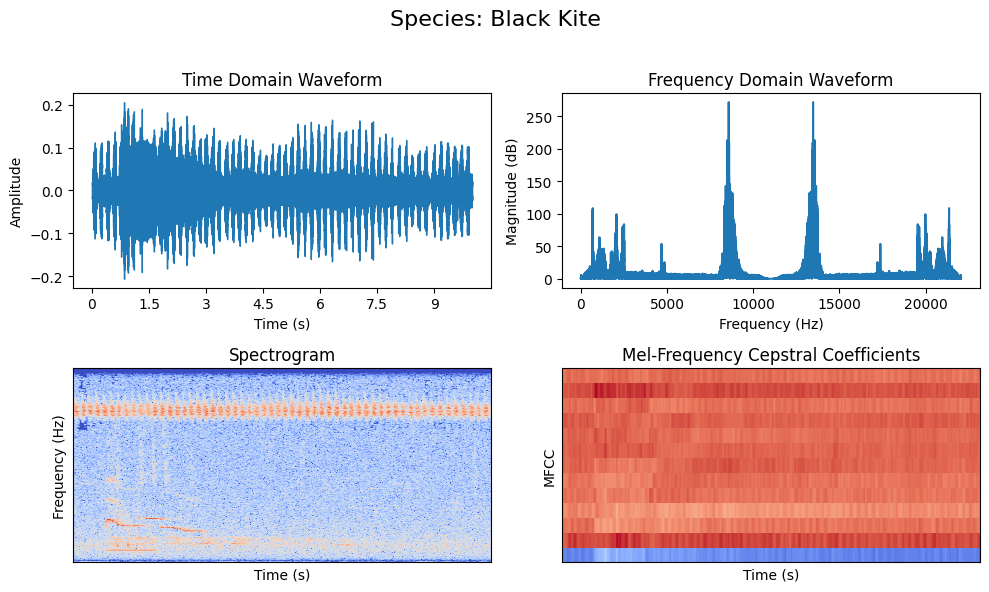

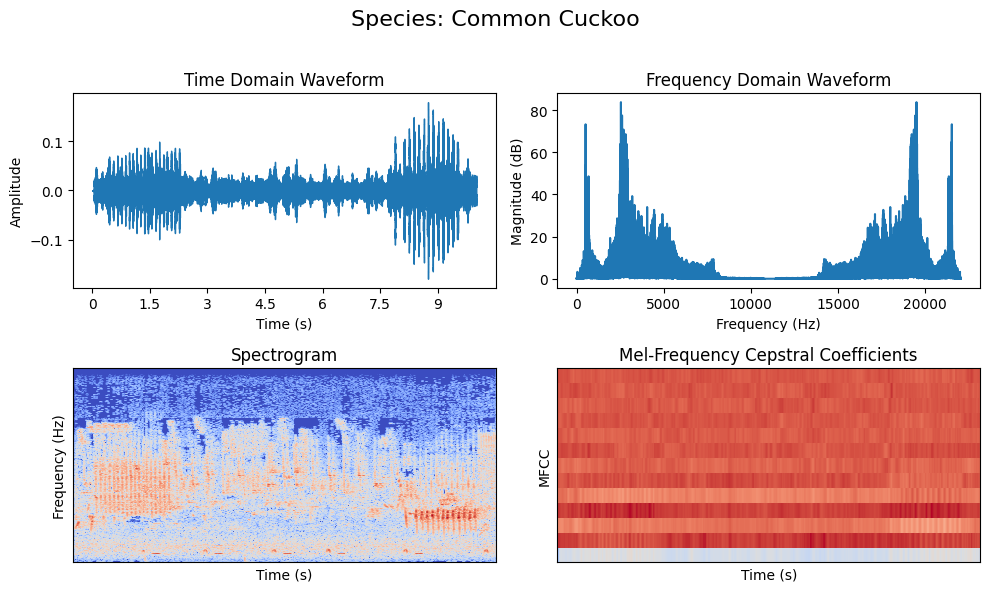

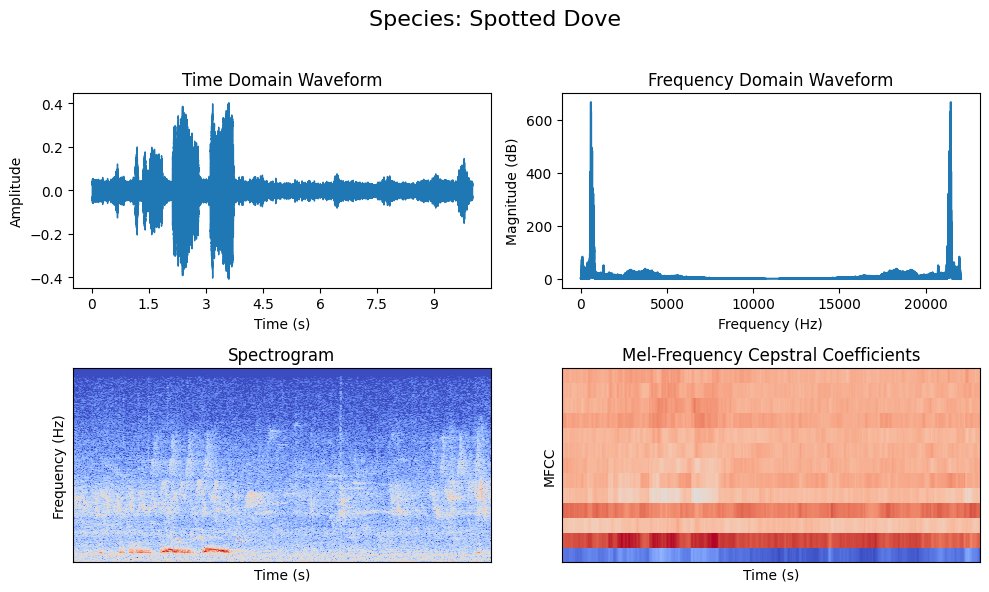

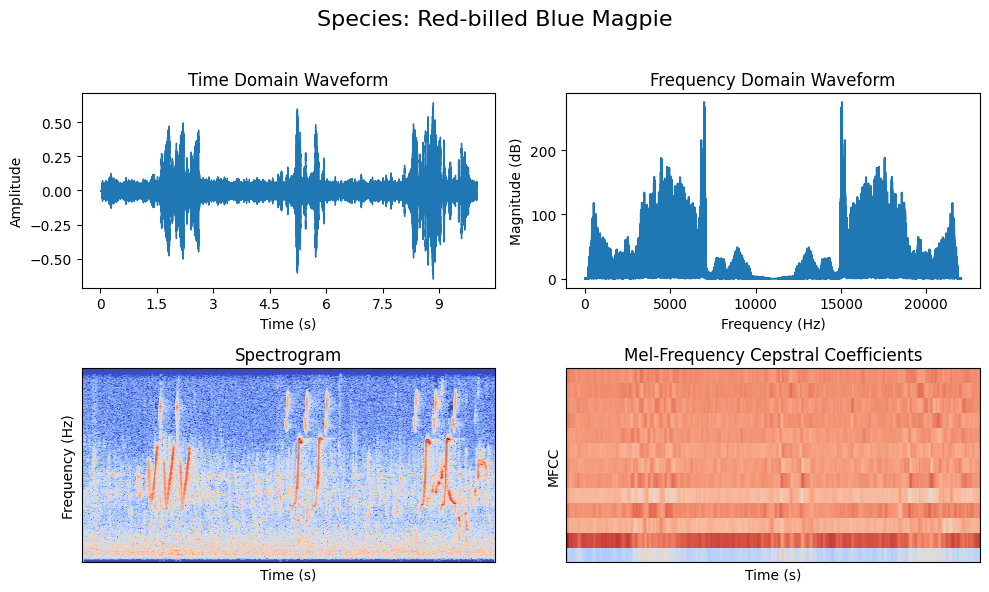

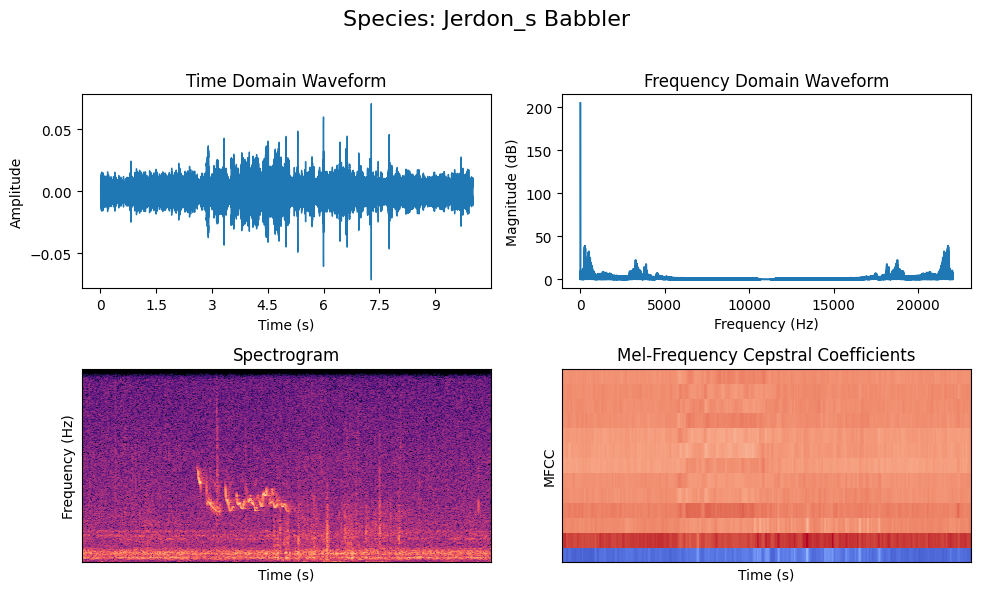

...

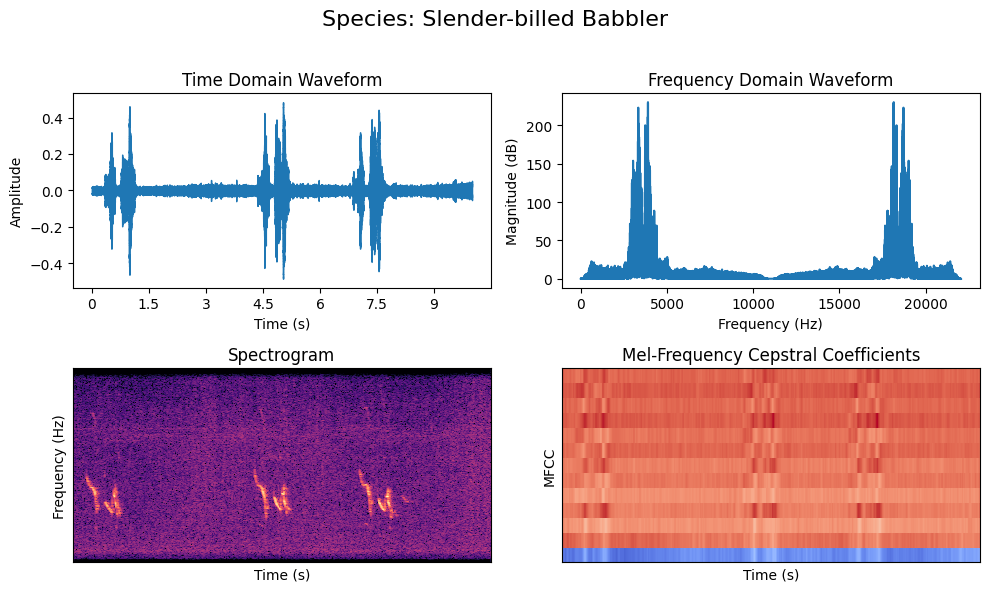

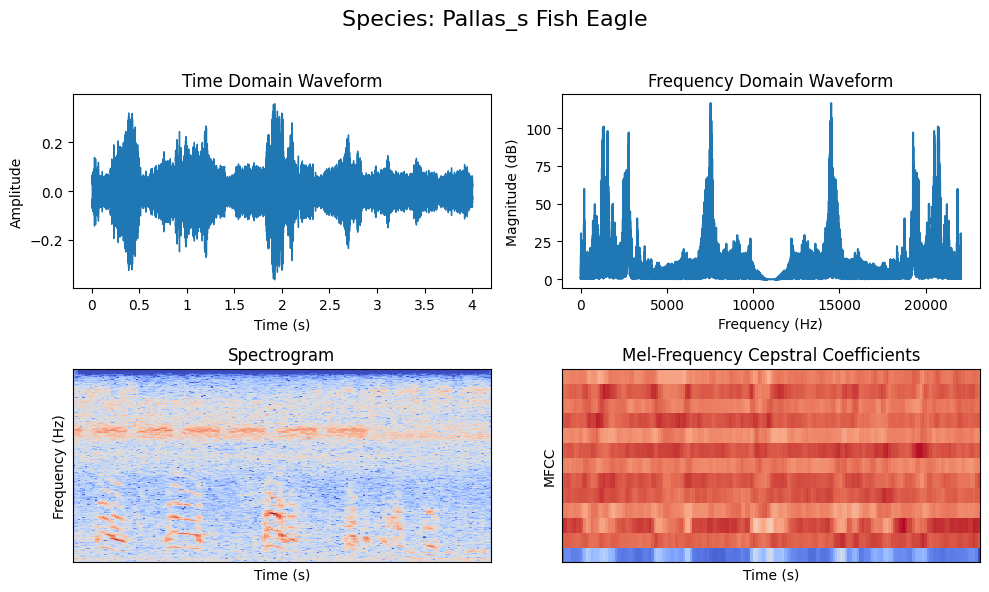

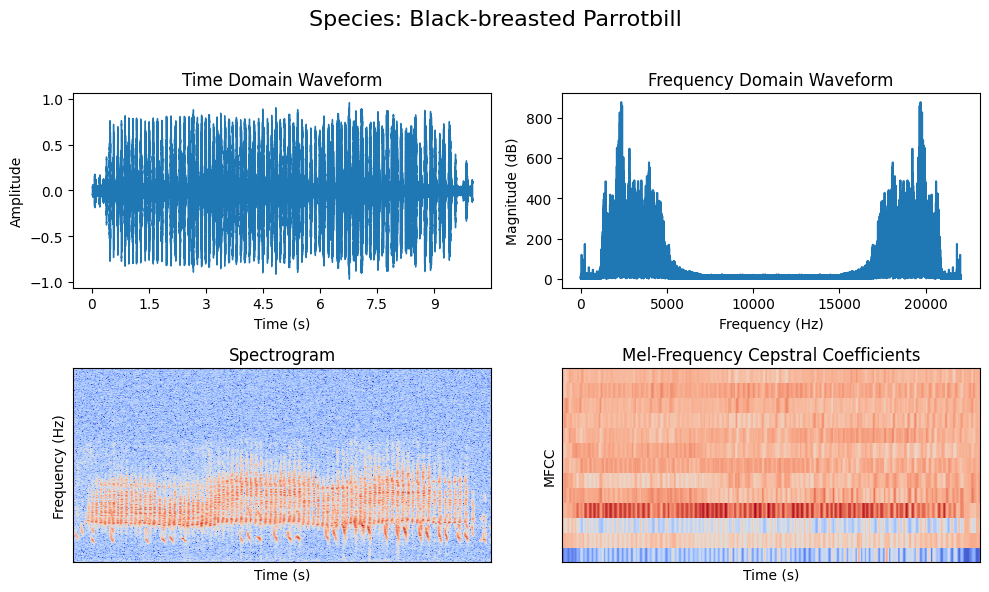

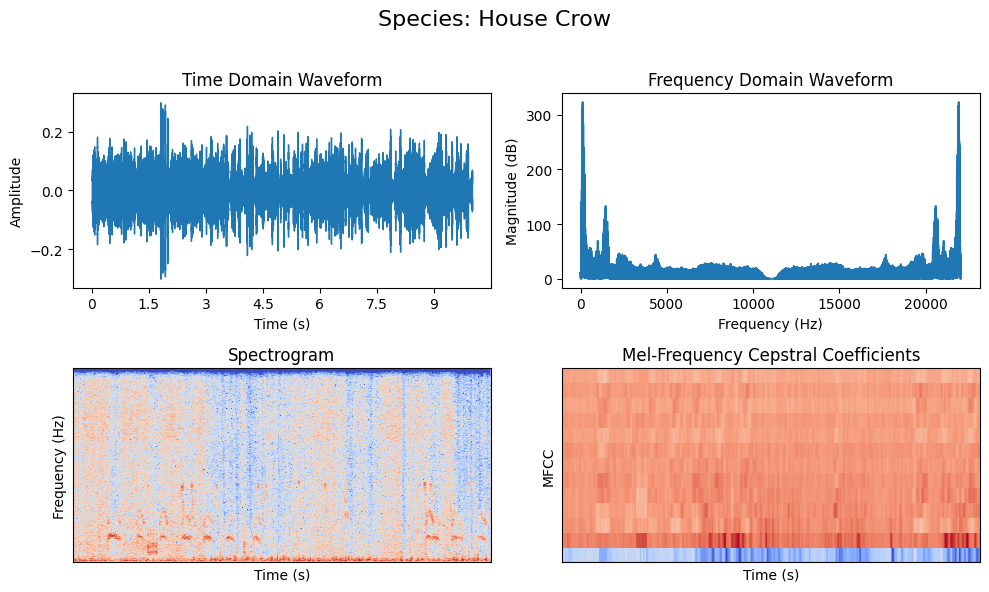

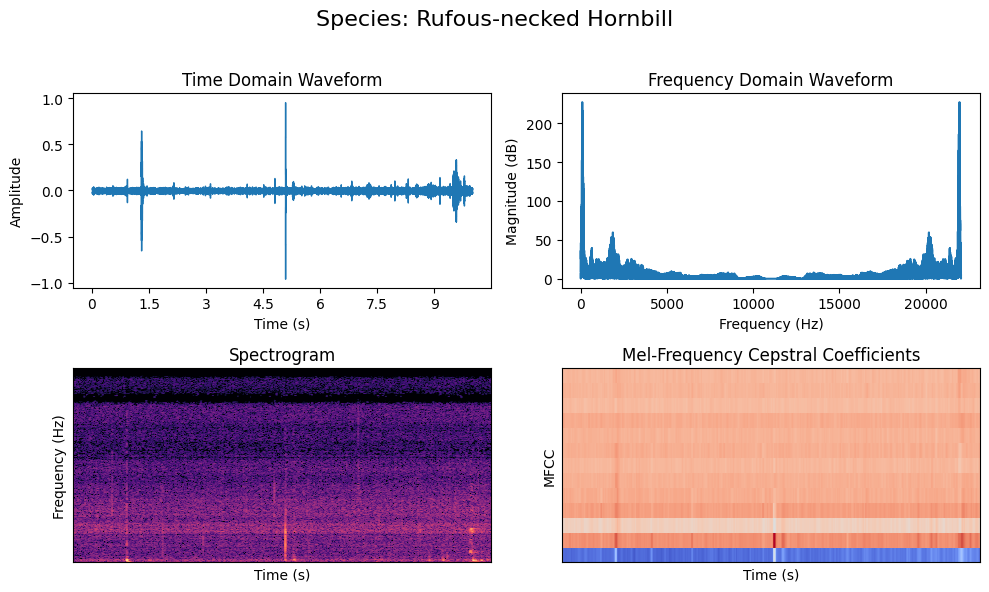

In [91]:
visualize_class_samples(training_folder)